Nota: Números das slices não coincidem com os de CT; ver razão/causa (done)

## Teste para 1 slice

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define folder path
image =  "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI_PNG/109.png"

slices_15_plus_points = []
num_slices_15_plus_points = 0
# Loop over all files in the folder

center_mri_x = []
center_mri_y = []
center_coordinates_mri = []

for i in range(1):
        img = cv2.imread(image, 0)


        #Thresh
        #thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
        #Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
        # Apply Gaussian blur to reduce noise
        blur = cv2.GaussianBlur(img, (5, 5), 0)
        # Apply Otsu's thresholding method
        ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30  # adjust as needed #OG: 10
        max_contour_area = 100  # adjust as needed #OG: 70
        max_distance_from_center = 250  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)
        #intensity_threshold = np.mean(intensity_array)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                center_mri_x.append(centroid_x)
                center_mri_y.append(centroid_y)

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)



        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        if len(filtered_contours) > 14:
            #slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
               # plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()
print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

print('############## /n Centros dos 10 primeiros blobs:')
for x, y in zip(center_mri_x[:10], center_mri_y[:10]):
    print("[{}, {}]".format(x, y))

<Figure size 900x900 with 1 Axes>

There are 1 slices with 10 or more detected inserts | Slice numbers: []
############## /n Centros dos 10 primeiros blobs:
[217, 389]
[197, 389]
[177, 389]
[157, 389]
[334, 388]
[314, 388]
[294, 388]
[280, 388]
[137, 389]
[117, 389]


Nota: Informação dada em pixels. Possível converter para distância física ou é necessário usar DICOM para isso? Sabendo o pixel deve saber-se a posição física right? Mais preciso do que isso é impossível, porque o pixel é o limite da precisão. Depois fazer diferença com centros de CT, mas é preciso alinhar os slice numbers para estarem direitos. Para algumas slices vão ser detetados mais blobs em CT do que MRI ou vice-versa; ver quais se referem ao mesmo sítio com distância máxima e eliminar o resto, para cada slice? Aí já se pode fazer diferença, e depois eventualmente criar um mapa de distorção.

## Para todos os slices

84


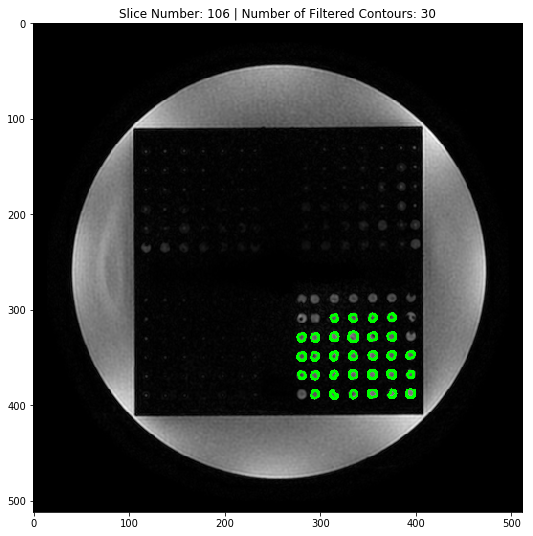

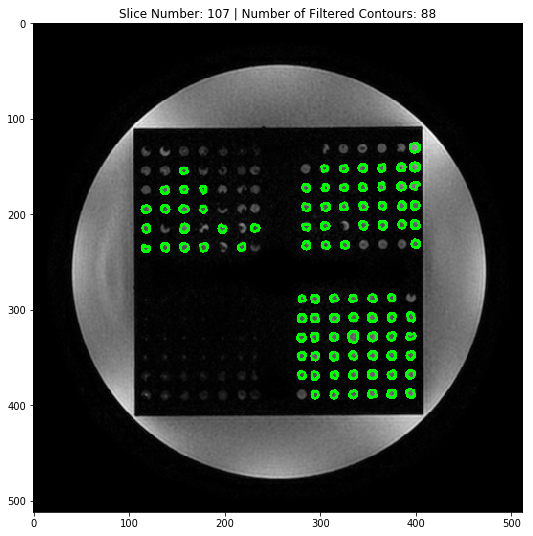

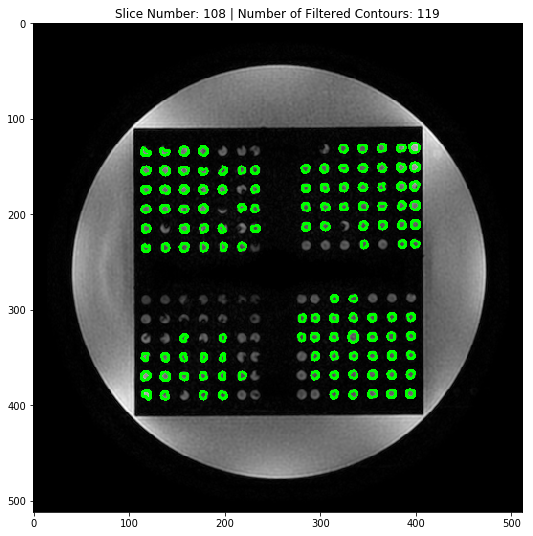

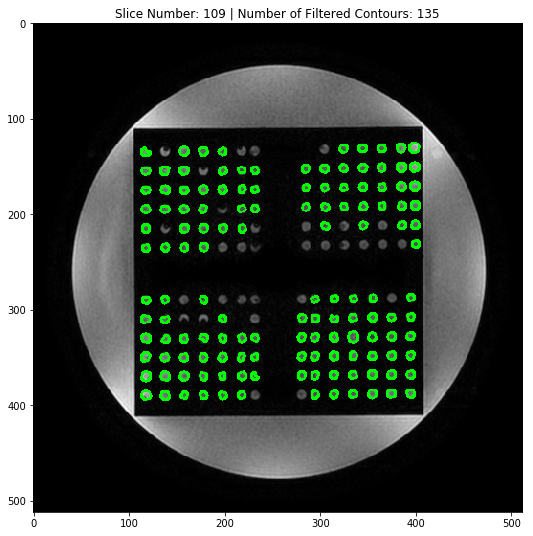

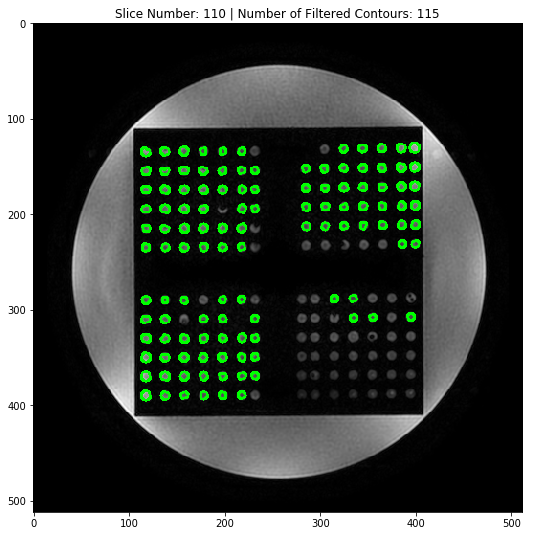

...

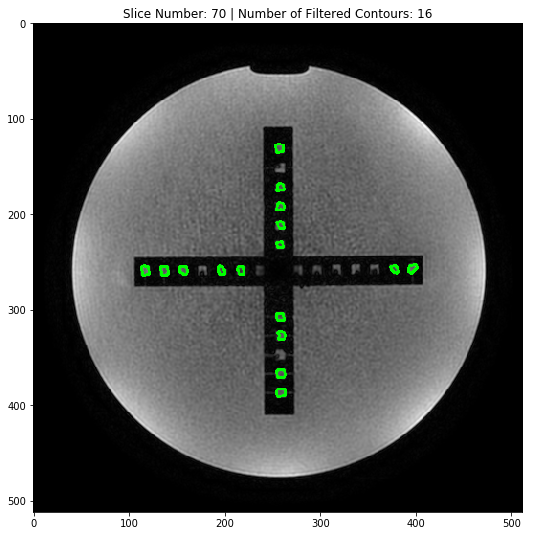

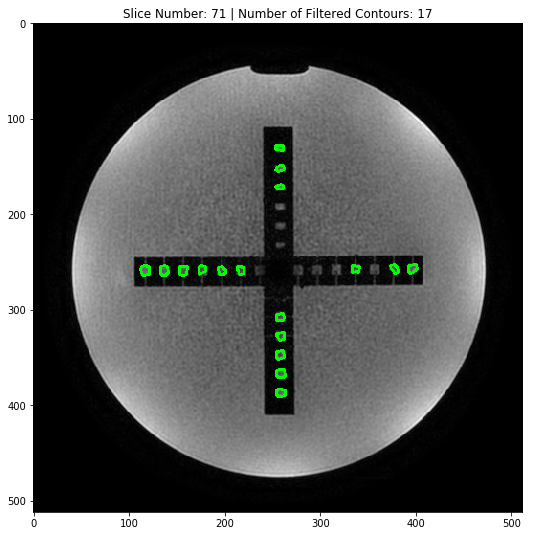

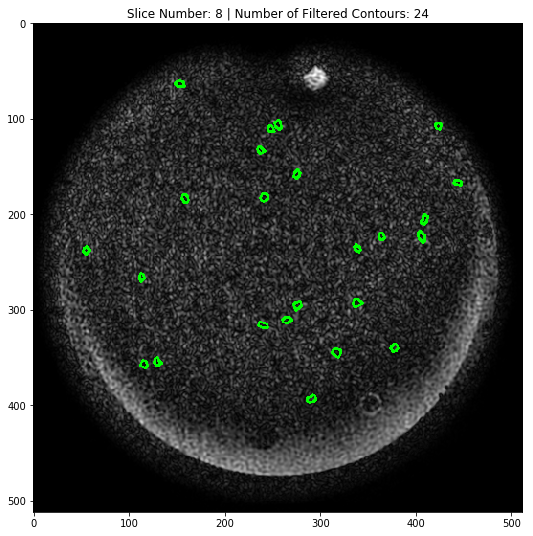

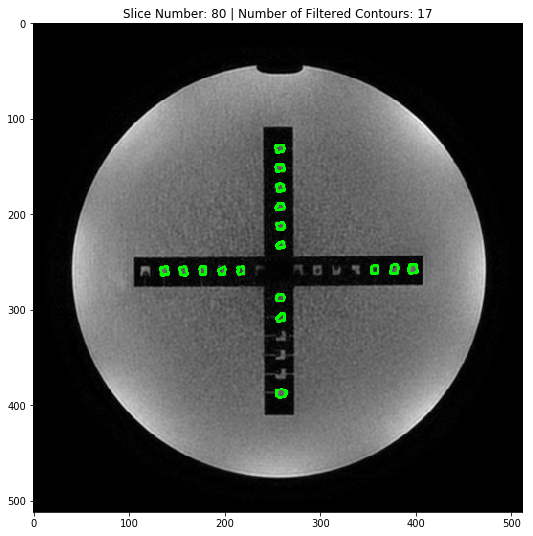

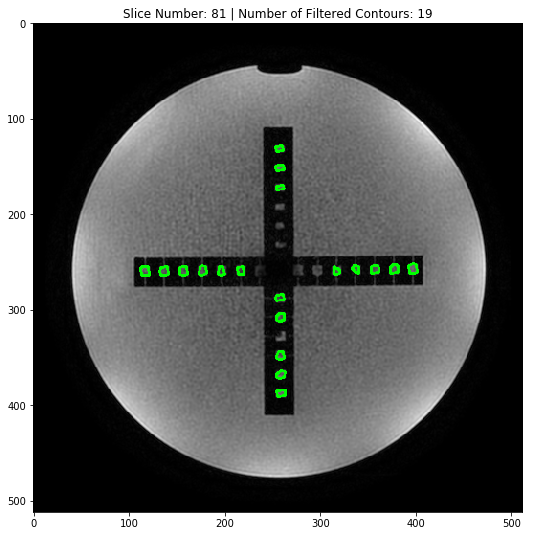

There are 30 slices with 15 or more detected inserts | Slice numbers: [106, 107, 108, 109, 110, 111, 112, 131, 151, 152, 176, 177, 178, 179, 180, 181, 182, 37, 38, 39, 40, 41, 60, 61, 7, 70, 71, 8, 80, 81]


In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Define folder path
folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI_PNG" 
#print(len(folder_path))

slices_15_plus_points = []
num_slices_15_plus_points = 0
# Loop over all files in the folder

center_mri_x = []
center_mri_y = []
center_coordinates_mri = []

for file_name in os.listdir(folder_path):
    #print(file_name)
    if file_name.endswith(".jpg") or file_name.endswith(".png"):  # Update with image file extensions
        slice_number = int(file_name[0:-4]) # MUDAR
        #print(f"Slice number: {slice_number}")
        # Read image
        image_path = os.path.join(folder_path, file_name)
        img = cv2.imread(image_path, 0)


        #Thresh
        #thresh = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)
        #Original: ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)
        # Apply Gaussian blur to reduce noise
        blur = cv2.GaussianBlur(img, (5, 5), 0)
        # Apply Otsu's thresholding method
        ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS) 
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30  # adjust as needed #OG: 10
        max_contour_area = 100  # adjust as needed #OG: 70
        max_distance_from_center = 250  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)
        #intensity_threshold = np.mean(intensity_array)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                center_mri_x.append(centroid_x)
                center_mri_y.append(centroid_y)

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)



        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()
print("There are {} slices with 15 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

Now providing DICOM folder as input instead of already giving already transformed .png folder

Nota: Fazer alterações para MRI, isto é basicamente a versão alterada do CT

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI Copy/" 
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI_PNG_V2/" 

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    i+= 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        dicom_image = pydicom.dcmread(dicom_path)
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)

        # Normalize pixel values to the full range of 16-bit grayscale
        img = dicom_image.pixel_array
        img_min = np.min(img)
        img_max = np.max(img)
        img = ((img - img_min) / (img_max - img_min) * (2 ** 16 - 1)).astype(np.uint16)

        # Save the image as 16-bit grayscale PNG
        cv2.imwrite(png_path, img)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4]) # Extract the slice number from the file name
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)

        #Thresh
        ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        # Define the minimum contour area and maximum distance from center
        min_contour_area = 30 #OG: 10 
        max_contour_area = 70
        max_distance_from_center = 160
        circularity_threshold = 0.8

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)

        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center:
                    if circularity >= circularity_threshold:
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


There are 0 slices with 10 or more detected inserts | Slice numbers: []


## Usando DICOM images

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder path
dicom_folder = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI 20230210"

slices_15_plus_points = []
num_slices_15_plus_points = 0
center_mri_x = []
center_mri_y = []
center_coordinates_mri = []

# Loop over all files in the folder
for filename in os.listdir(dicom_folder):
    if filename.endswith(".dcm"):
        # Read the DICOM file
        dicom_path = os.path.join(dicom_folder, filename)
        ds = pydicom.dcmread(dicom_path)

        # Get the pixel array from the DICOM file
        img = ds.pixel_array

        # Convert the image data type to 8-bit unsigned
        img = img.astype(np.uint8)

        # Apply image processing operations as before
        blur = cv2.GaussianBlur(img, (5, 5), 0)
        ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_TC89_KCOS)

        # Process the contours and extract the centroids
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2
        min_contour_area = 30
        max_contour_area = 100
        max_distance_from_center = 250
        circularity_threshold = 0.7

        filtered_contours = []
        for contour in contours:
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                center_mri_x.append(centroid_x)
                center_mri_y.append(centroid_y)

                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center and circularity >= circularity_threshold:
                    mask = np.zeros(img.shape, dtype=np.uint8)
                    cv2.drawContours(mask, [contour], 0, 255, -1)
                    mean_intensity = cv2.mean(img, mask=mask)[0]

                    if mean_intensity > intensity_threshold:
                        filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        # Check if the number of filtered contours meets the condition
        if len(filtered_contours) > 1:
            slices_15_plus_points.append(ds.InstanceNumber)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 2 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(ds.InstanceNumber, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))

print('Centers of the first 10 blobs:')
for x, y in zip(center_mri_x[:10], center_mri_y[:10]):
    print("[{}, {}]".format(x, y))


There are 0 slices with 10 or more detected inserts | Slice numbers: []
Centers of the first 10 blobs:
[262, 321]
[276, 308]
[286, 296]
[282, 285]
[346, 259]
[379, 253]
[427, 174]
[50, 148]
[170, 473]
[254, 447]


PNG E DICOM como input

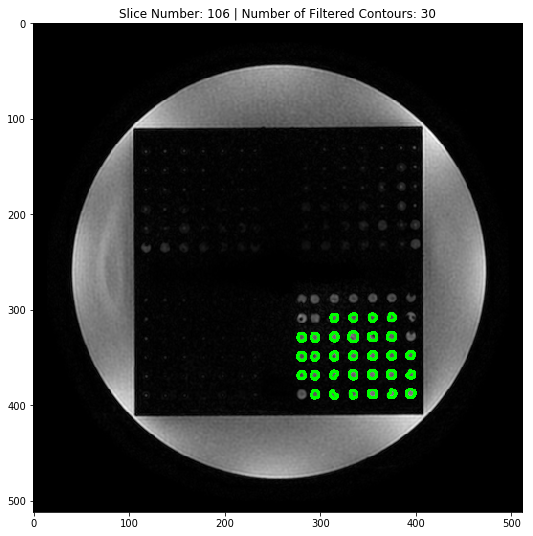

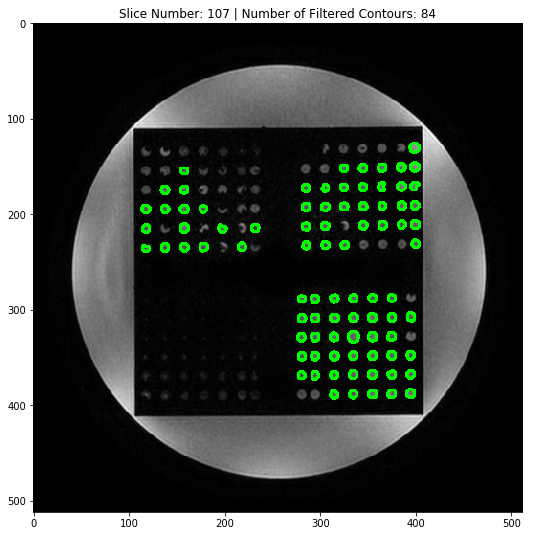

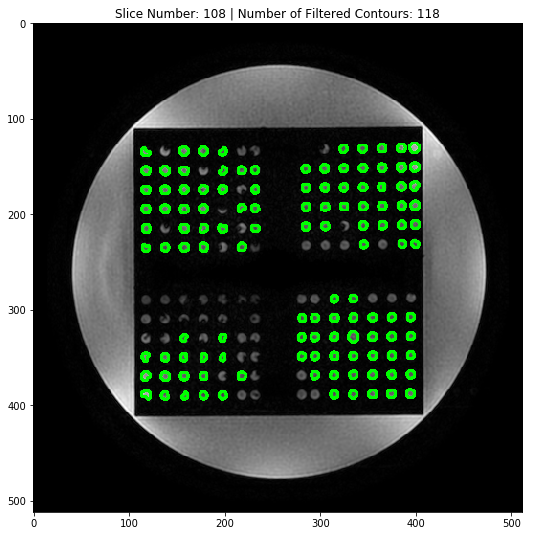

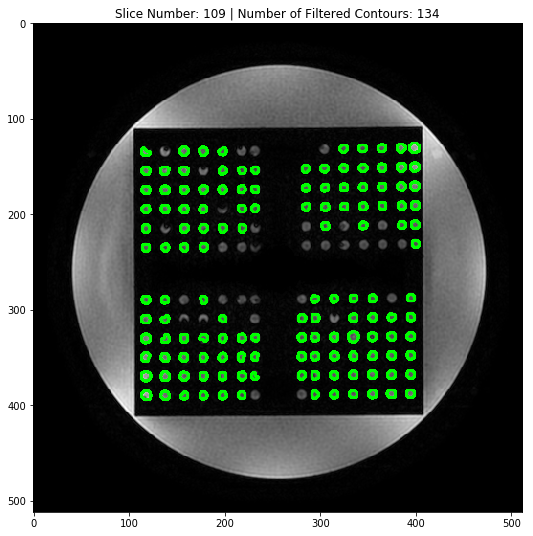

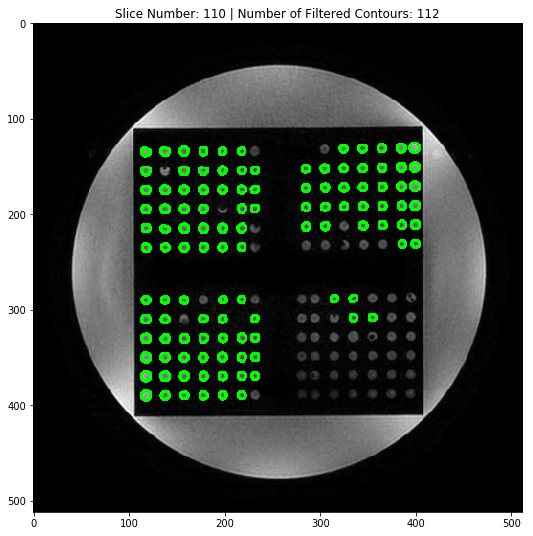

...

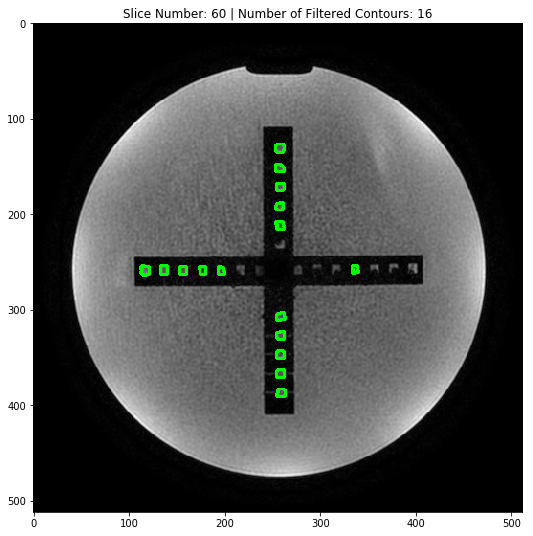

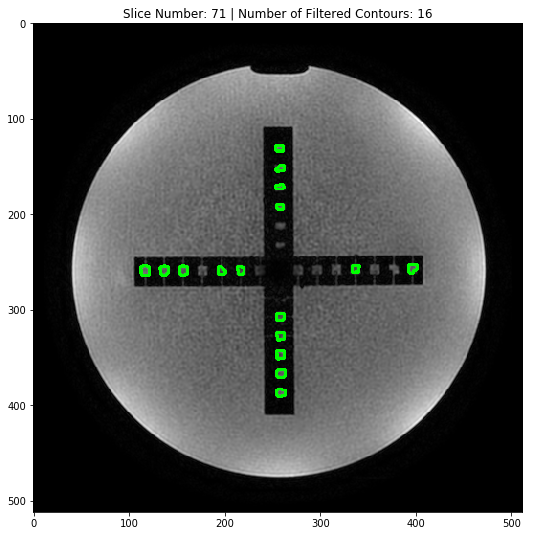

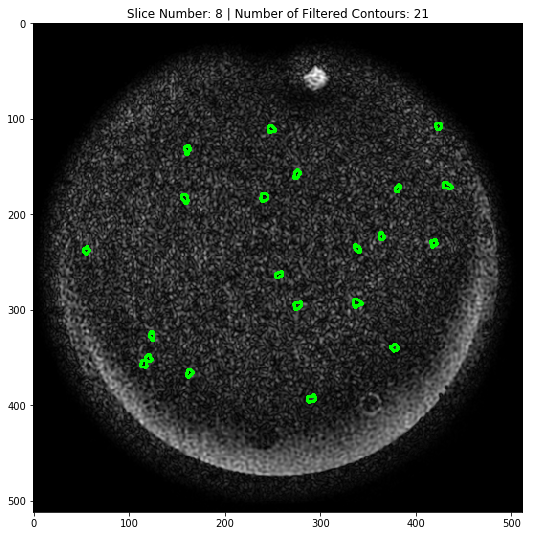

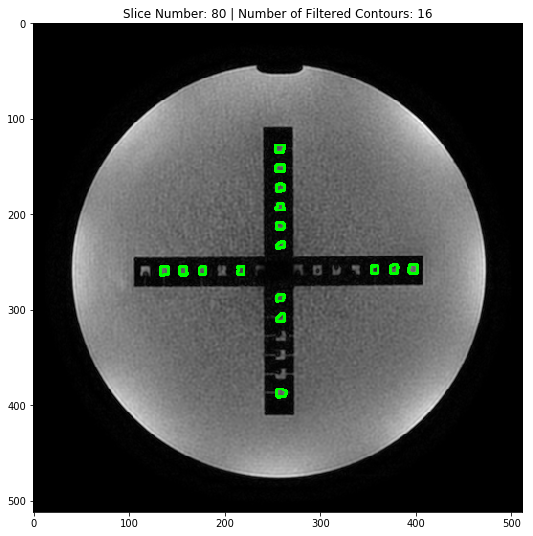

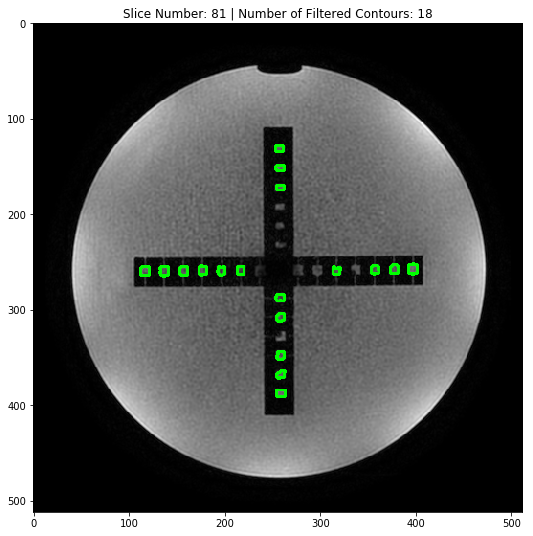

There are 26 slices with 10 or more detected inserts | Slice numbers: [106, 107, 108, 109, 110, 111, 112, 151, 176, 177, 178, 179, 180, 181, 182, 37, 38, 39, 40, 41, 42, 60, 71, 8, 80, 81]


In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder paths
dicom_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI Copy/" 
png_folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI_PNG_V2/" 

# Convert DICOM images to PNG
i = 0
for file_name in os.listdir(dicom_folder_path):
    i+= 1
    if file_name.endswith(".dcm"):
        dicom_path = os.path.join(dicom_folder_path, file_name)
        dicom_image = pydicom.dcmread(dicom_path)
        png_file_name = str(i) + ".png"
        png_path = os.path.join(png_folder_path, png_file_name)

        # Normalize pixel values to the full range of 16-bit grayscale
        img = dicom_image.pixel_array
        img_min = np.min(img)
        img_max = np.max(img)
        img = ((img - img_min) / (img_max - img_min) * (2 ** 16 - 1)).astype(np.uint16)

        # Save the image as 16-bit grayscale PNG
        cv2.imwrite(png_path, img)

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the PNG folder
for file_name in os.listdir(png_folder_path):
    if file_name.endswith(".png"):
        slice_number = int(file_name[:-4]) # Extract the slice number from the file name
        image_path = os.path.join(png_folder_path, file_name)
        img = cv2.imread(image_path, 0)
        
        blur = cv2.GaussianBlur(img, (5, 5), 0)
        # Apply Otsu's thresholding method
        ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)
        #Thresh
        #ret, thresh = cv2.threshold(img, 200, 255, cv2.THRESH_BINARY)

        #Finding the contours in the image
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2
        
        min_contour_area = 30  # adjust as needed #OG: 10
        max_contour_area = 100  # adjust as needed #OG: 70
        max_distance_from_center = 250  # adjust as needed; para a mesa não aparecer #OG: 500
        #intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []

        intensity_array = []
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)

        intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            perimeter = cv2.arcLength(contour, True)
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2 - 0.01))

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                if distance_from_center <= max_distance_from_center:
                    if circularity >= circularity_threshold:
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)

        image_with_filtered_contours = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)

        if len(filtered_contours) > 14:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points % 1 == 0:
                plt.figure(figsize=(9, 9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()

print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))


Apenas DICOM como input

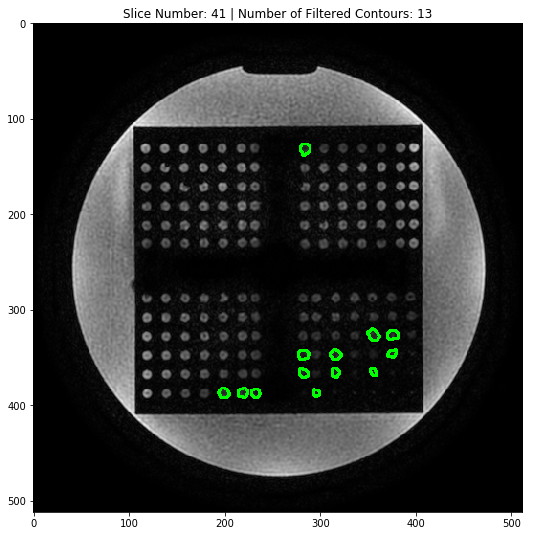

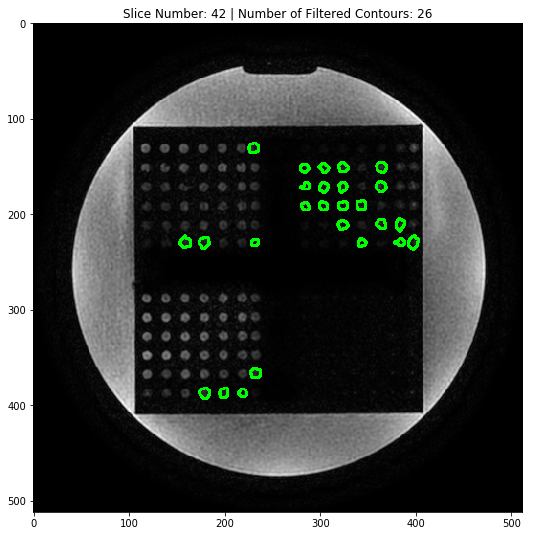

There are 2 slices with 10 or more detected inserts | Slice numbers: ['41', '42']


In [6]:
#folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/CT 20230210"

import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import pydicom

# Define folder path
folder_path = "C:/Users/bernc/OneDrive/Ambiente de Trabalho/TESE/PC work/Imagens_IPO_23_FEV/MRI Copy/" 

slices_15_plus_points = []
num_slices_15_plus_points = 0

# Loop over all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".dcm"):
        image_path = os.path.join(folder_path, file_name)
        
        # Read DICOM image
        ds = pydicom.dcmread(image_path)

        # Extract slice number from DICOM metadata
        slice_number = ds.InstanceNumber

        # Read pixel data
        img = ds.pixel_array

        # Check if the image is already grayscale
        if len(img.shape) > 2 and img.shape[2] == 3:
            # Convert to grayscale
            gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        else:
            gray_img = img
        gray_img = cv2.convertScaleAbs(gray_img)


        blur = cv2.GaussianBlur(gray_img, (5, 5), 0)
        # Apply Otsu's thresholding method
        ret, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

        # Ensure thresh is in the correct format (CV_8UC1)
        if thresh.dtype != np.uint8:
            thresh = thresh.astype(np.uint8)

        # Find contours
        contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        #original: cv2.CHAIN_APPROX_SIMPLE no 2º parâmetro
        #print('NÚMER DE CONTOURS antes dos filtros: ', len(contours))

        # Get the center of the image
        image_height, image_width = img.shape[:2]
        center_x = image_width // 2
        center_y = image_height // 2

        min_contour_area = 30  # adjust as needed #OG: 10
        max_contour_area = 100  # adjust as needed #OG: 70
        max_distance_from_center = 160  # adjust as needed; para a mesa não aparecer #OG: 500
        intensity_threshold = 160  # adjust as needed; para filtrar os que têm ar

        # Define the circularity threshold
        circularity_threshold = 0.7  # adjust as needed #OG: 0.7

        # Filter contours based on size and distance from center
        filtered_contours = []


        intensity_array = [] #Para fazer com que o threshold de intensidade interno seja a média das intensidades
        #Todos os inserts cuja média de intensidades dos pixels internos seja inferior à média têm demasiado ar
        #Podia usar critério mais relaxado
        for contour in contours:
            mask = np.zeros(img.shape, dtype=np.uint8)
            cv2.drawContours(mask, [contour], 0, 255, -1)
            mean_intensity = cv2.mean(img, mask=mask)[0]
            intensity_array.append(mean_intensity)
        #print(intensity_array)
        #intensity_threshold = np.mean(intensity_array)
        ##Agora, implemento threshold que é 10% abaixo da média da imagem
        
        #intensity_threshold = np.mean(intensity_array) - (np.mean(intensity_array) * 0.1)
        intensity_threshold = 150

        for contour in contours:
            # Calculate the contour area
            contour_area = cv2.contourArea(contour)
            # Calculate the area and perimeter of the contour
            perimeter = cv2.arcLength(contour, True)

            # Calculate the circularity of the contour
            circularity = 4 * np.pi * (contour_area / (perimeter ** 2-0.01)) #+0.01 para não dividir por zero

            if contour_area >= min_contour_area and contour_area <= max_contour_area:
                # Calculate the centroid of the contour
                M = cv2.moments(contour)
                centroid_x = int(M["m10"] / M["m00"])
                centroid_y = int(M["m01"] / M["m00"])

                # Calculate the distance from the centroid to the center of the image
                distance_from_center = np.sqrt((centroid_x - center_x) ** 2 + (centroid_y - center_y) ** 2)

                # Filter contours based on distance from center
                if distance_from_center <= max_distance_from_center:
                    # Filter contours based on circularity
                    if circularity >= circularity_threshold:
                        #filtered_contours.append(contour)
                        mask = np.zeros(img.shape, dtype=np.uint8)
                        cv2.drawContours(mask, [contour], 0, 255, -1)
                        mean_intensity = cv2.mean(img, mask=mask)[0]
                        #print(mean_intensity)
                        if mean_intensity > intensity_threshold:
                            filtered_contours.append(contour)


        # Convert the image to a compatible format before converting it to color
        img_8bit = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)
        #print('NÚMER DE CONTOURS depois dos filtros: ', len(filtered_contours))
        # Draw filtered contours on the original image
        image_with_filtered_contours = cv2.cvtColor(img_8bit, cv2.COLOR_GRAY2BGR)
        cv2.drawContours(image_with_filtered_contours, filtered_contours, -1, (0, 255, 0), 2)


        # Display the original image with filtered contours
        ##cv2.imshow('Image with Filtered Contours', image_with_filtered_contours)
        ##cv2.waitKey(0)
        ##cv2.destroyAllWindows()


        #save output img
        ##cv2.imwrite('output_img.png', img)

        # display it
        
        if len(filtered_contours) > 9:
            slices_15_plus_points.append(slice_number)
            num_slices_15_plus_points += 1
            if num_slices_15_plus_points%1 == 0: #so not all are shown, but only every 2 appliable slices, I can use %2, for example
                plt.figure(figsize=(9,9))
                imgplot = plt.imshow(image_with_filtered_contours)
                plt.title("Slice Number: {} | Number of Filtered Contours: {}".format(slice_number, len(filtered_contours)))
                plt.show()
print("There are {} slices with 10 or more detected inserts | Slice numbers: {}".format(num_slices_15_plus_points, slices_15_plus_points))